# <font color="#114b98">Segmentez des clients d'un site e-commerce</font>

## <font color="#114b98">Notebook d'analyse exploratoire</font>

**Votre mission**

Votre mission est d’aider les équipes d’Olist à comprendre les différents types d'utilisateurs. Vous utiliserez donc des méthodes non supervisées pour regrouper des clients de profils similaires. Ces catégories pourront être utilisées par l’équipe Marketing pour mieux communiquer.

Vous créez donc un notebook et démarrez votre travail d’analyse exploratoire.

## <font color="#114b98">Sommaire</font>
[1. Chargement des jeux de données](#section_1)

[2. Description de chaque jeu de données](#section_2)  

[3. Concaténation des données](#section_3)  

[4. Traitement des données manquantes](#section_4)  

[5. Analyse multivariée](#section_5)   

[6. Sauvegarde des données](#section_6)

## <font color="#114b98" id="section_1">1. Chargement des jeux de données</font>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import os
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
plt.rc('axes', titlesize=22) 
plt.rc('axes', labelsize=18) 
titleprops = {'fontsize':20}
textprops = {'fontsize':15}
plt.style.use('ggplot')

In [3]:
#pip install flake8 pycodestyle_magic
# %load_ext pycodestyle_magic
# %pycodestyle_on

Nous avons à notre disposition 9 jeux de données.

In [4]:
main_path = 'N:/5 - WORK/1 - Projets/Projet 4/'
files = os.listdir(main_path+'ressources/')
files

['olist_customers_dataset.csv',
 'olist_geolocation_dataset.csv',
 'olist_orders_dataset.csv',
 'olist_order_items_dataset.csv',
 'olist_order_payments_dataset.csv',
 'olist_order_reviews_dataset.csv',
 'olist_products_dataset.csv',
 'olist_sellers_dataset.csv',
 'product_category_name_translation.csv']

Je crée un dictionnaire dans lequel je range les noms des jeux de données en clefs et leurs contenus dans les valeurs.

In [5]:
%%time
datasets = {}
for filename in files:
    datasets[str(filename)[:-4]] = pd.read_csv(main_path+'ressources/'+filename)

Wall time: 1.14 s


In [6]:
for key, value in datasets.items():
    print("Le dataset {} compte {} lignes et {} colonnes.".
          format(key, value.shape[0], value.shape[1]))
    print("Données manquantes : {} %.\n".
          format(round(value.isna().sum().sum() /
                       (value.shape[0]*value.shape[1])*100)))

Le dataset olist_customers_dataset compte 99441 lignes et 5 colonnes.
Données manquantes : 0 %.

Le dataset olist_geolocation_dataset compte 1000163 lignes et 5 colonnes.
Données manquantes : 0 %.

Le dataset olist_orders_dataset compte 99441 lignes et 8 colonnes.
Données manquantes : 1 %.

Le dataset olist_order_items_dataset compte 112650 lignes et 7 colonnes.
Données manquantes : 0 %.

Le dataset olist_order_payments_dataset compte 103886 lignes et 5 colonnes.
Données manquantes : 0 %.

Le dataset olist_order_reviews_dataset compte 99224 lignes et 7 colonnes.
Données manquantes : 21 %.

Le dataset olist_products_dataset compte 32951 lignes et 9 colonnes.
Données manquantes : 1 %.

Le dataset olist_sellers_dataset compte 3095 lignes et 4 colonnes.
Données manquantes : 0 %.

Le dataset product_category_name_translation compte 71 lignes et 2 colonnes.
Données manquantes : 0 %.



In [7]:
pd.set_option('display.max_column', 60)

Pour simplifier les manipulations, je vais affecter chaque jeu de données à une nouvelle variable afin d'en simplifier la manipulation.

In [8]:
customers = datasets['olist_customers_dataset']
geolocation = datasets['olist_geolocation_dataset']
orders = datasets['olist_orders_dataset']
items = datasets['olist_order_items_dataset']
payments = datasets['olist_order_payments_dataset']
reviews = datasets['olist_order_reviews_dataset']
products = datasets['olist_products_dataset']
sellers = datasets['olist_sellers_dataset']
translation = datasets['product_category_name_translation']

## <font color="#114b98" id="section_2">2. Description de chaque jeu de données</font>

### 2.1 Étude des clients (customers)

In [9]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [10]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


Ce jeu de données comporte 99441 clients.

In [11]:
customers.customer_id.duplicated().sum()

0

In [12]:
print("Les clients sont répartis dans {} états et {} villes."
      .format(customers["customer_state"].nunique(),
              customers["customer_city"].nunique()))

Les clients sont répartis dans 27 états et 4119 villes.


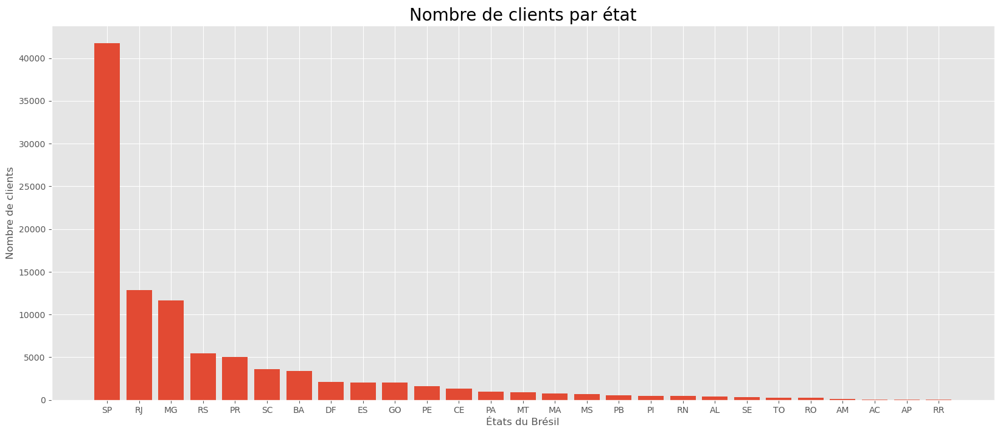

In [13]:
fig = plt.figure(figsize=(20, 8))
plt.bar(x=customers["customer_state"].value_counts().index,
        height=customers["customer_state"].value_counts())
plt.title("Nombre de clients par état", titleprops)
plt.xlabel("États du Brésil")
plt.ylabel("Nombre de clients")
plt.show()

L'état où le plus de clients sont présents est celui de Sao Paulo (capitale économique du Brésil), suivi par celui de Rio.

### 2.2 Étude des vendeurs (sellers)

In [14]:
sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [15]:
sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [16]:
print("Les vendeurs sont répartis dans {} états et {} villes."
      .format(sellers["seller_state"].nunique(),
              sellers["seller_city"].nunique()))

Les vendeurs sont répartis dans 23 états et 611 villes.


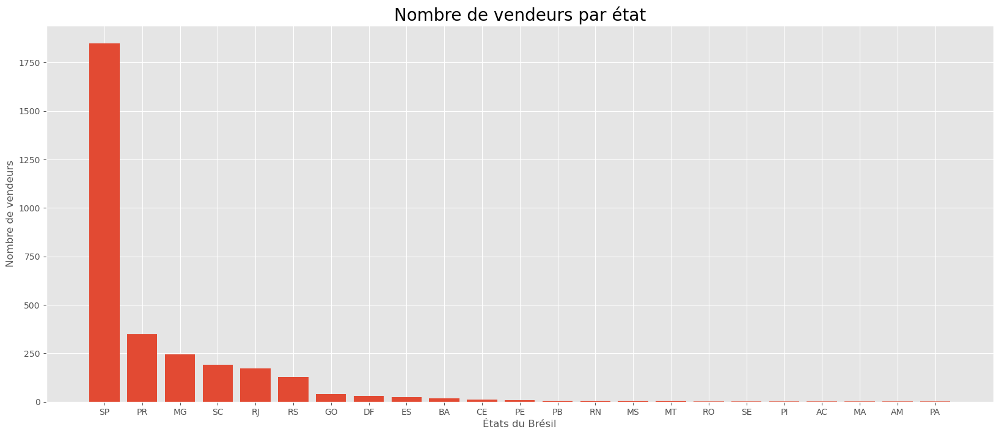

In [17]:
fig = plt.figure(figsize=(20, 8))
plt.bar(x=sellers["seller_state"].value_counts().index,
        height=sellers["seller_state"].value_counts())
plt.title("Nombre de vendeurs par état", titleprops)
plt.xlabel("États du Brésil")
plt.ylabel("Nombre de vendeurs")
plt.show()

La majorité des vendeurs est dans l'état de Sao Paulo (capitale économique du Brésil).

### 2.3 Étude de la géolocalisation (geolocation)

In [18]:
geolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [19]:
geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


J'utilse un scatterplot afin d'observer la répartition des observations.

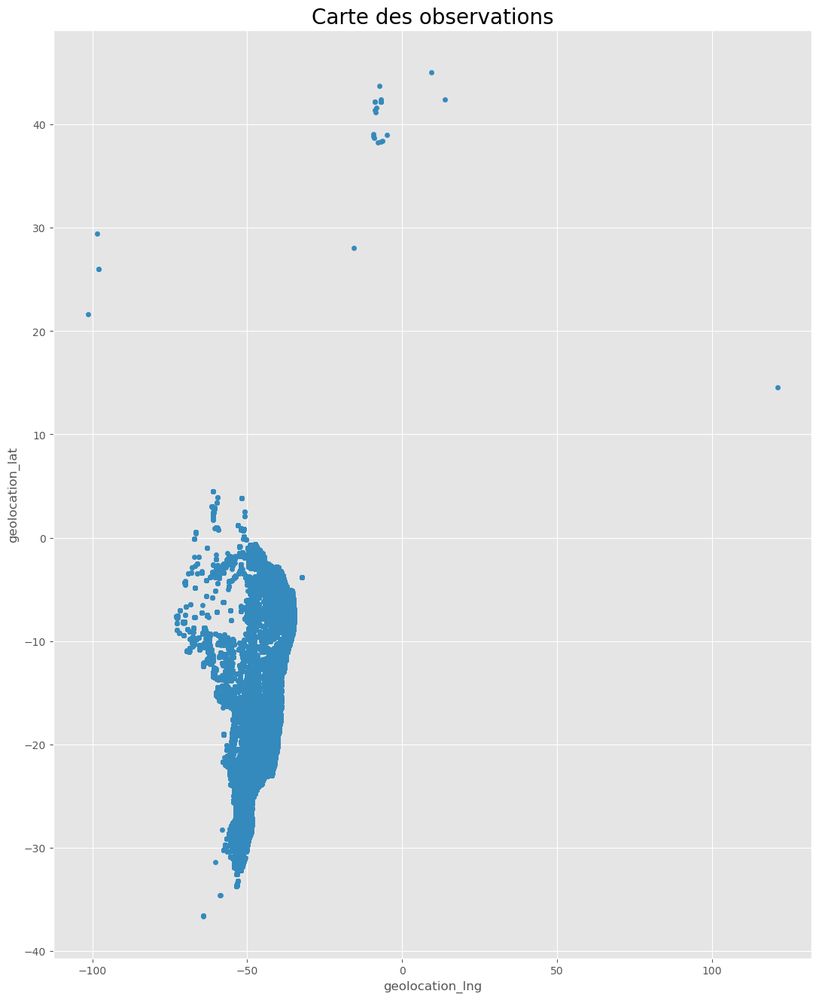

In [20]:
geolocation.plot(kind="scatter",
                 x="geolocation_lng",
                 y="geolocation_lat",
                 figsize=(13, 16))
plt.title('Carte des observations',
          titleprops)
plt.show()

Certaines observations sont en dehors des plages de latitudes et longitudes du Brésil.

In [21]:
geolocation = geolocation[geolocation.geolocation_lat <= 5.26946800]
geolocation = geolocation[geolocation.geolocation_lng >= -73.98283100]
geolocation = geolocation[geolocation.geolocation_lat >= -33.75117000]
geolocation = geolocation[geolocation.geolocation_lng <= -34.79314700]

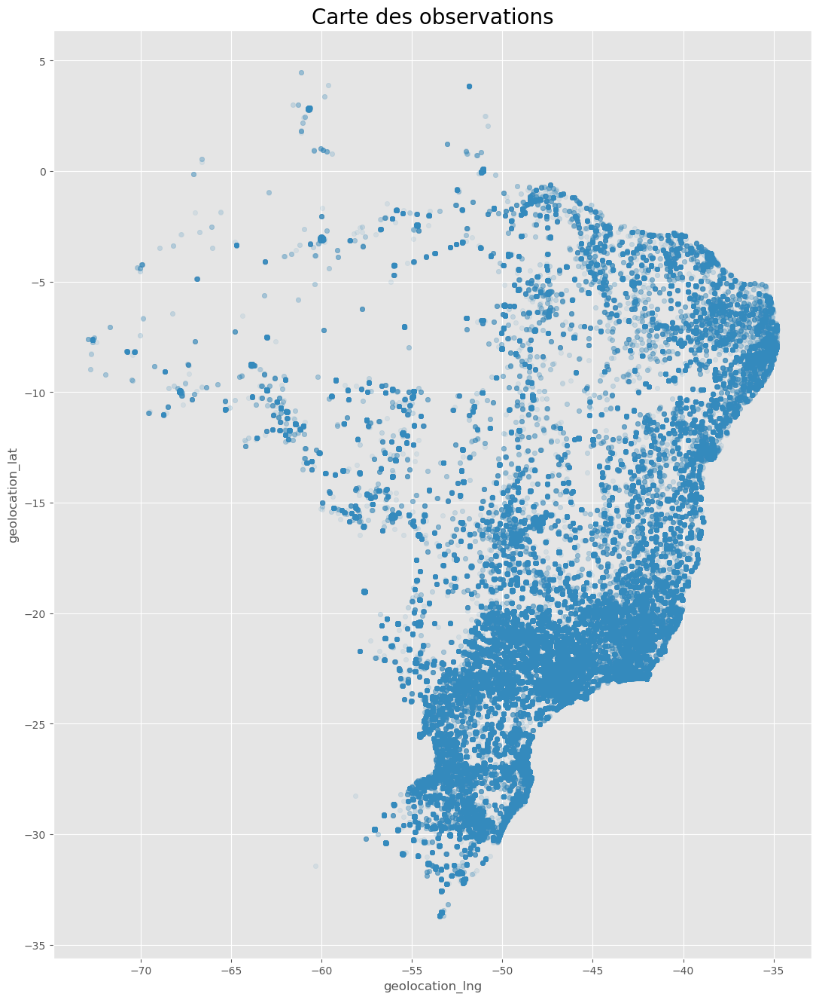

In [22]:
geolocation.plot(kind="scatter",
                 x="geolocation_lng",
                 y="geolocation_lat",
                 alpha=0.1,
                 figsize=(13, 16))
plt.title('Carte des observations',
          titleprops)
plt.show()

### 2.4 Étude des commandes (orders)

In [23]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [24]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


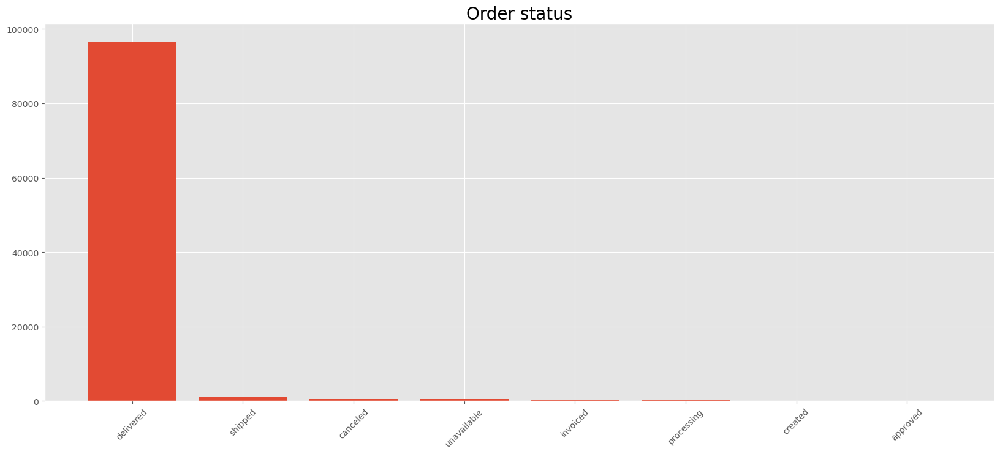

In [25]:
# Nombre de commandes par statuts d'achats
order_status = orders["order_status"].value_counts()
fig = plt.figure(figsize=(20, 8))
plt.bar(x=order_status.index, height=order_status.values)
plt.title("Order status", titleprops)
plt.xticks(rotation=45)
plt.show()

Je conserve uniquement les commandes marquées comme délivrées.

In [26]:
orders = orders[orders["order_status"] == "delivered"]

Je passe en 'datetime' les colonnes de dates.

In [27]:
date_columns = ['order_delivered_carrier_date',
                'order_estimated_delivery_date',
                'order_purchase_timestamp',
                'order_approved_at',
                'order_delivered_customer_date']

In [28]:
orders[date_columns] = orders[date_columns].astype('datetime64[ns]')

### 2.5 Étude des objets (items)

In [29]:
items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [30]:
items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [31]:
items['shipping_limit_date'] = items['shipping_limit_date'].astype('datetime64[ns]')

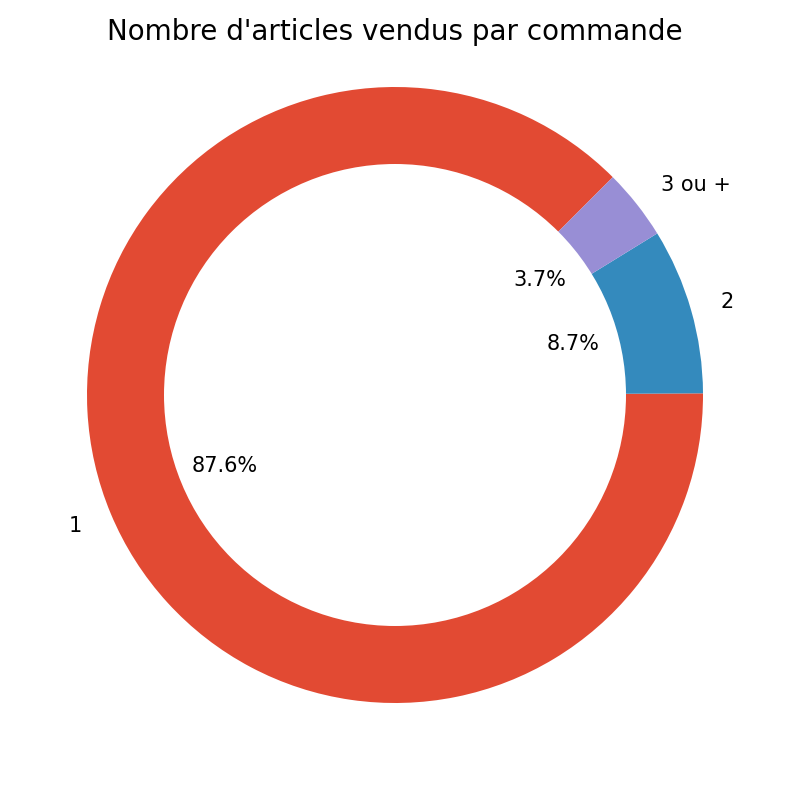

In [32]:
imp_unarticle = items["order_item_id"].value_counts().values[0]/len(items)
imp_deuxarticles = items["order_item_id"].value_counts().values[1]/len(items)
values = [imp_unarticle,
          imp_deuxarticles,
          1 - imp_unarticle - imp_deuxarticles]
fig = plt.figure(figsize=(10, 10))
plt.pie(values,
        labels=["1", "2", "3 ou +"],
        autopct='%1.1f%%',
        textprops=textprops,
        startangle=45)
centre_circle = plt.Circle((0, 0), 0.75, fc='white')
fig.gca().add_artist(centre_circle)
plt.title("Nombre d'articles vendus par commande", titleprops, y=0.95)
plt.show()

La majorité des commande comporte un seul article.

### 2.6 Étude des paiements (payments)

In [33]:
payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [34]:
payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


Nous pouvons observer la répartition des paiements.

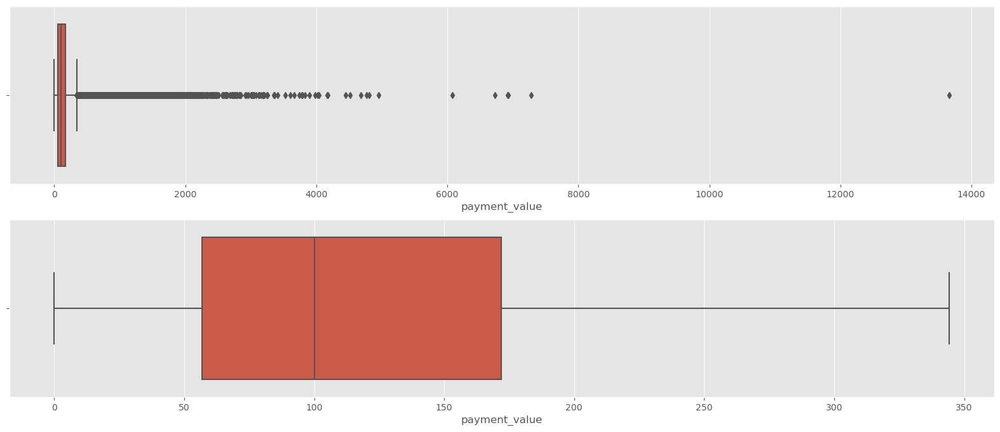

In [35]:
fig = plt.figure(figsize=(20, 8))
plt.title('Diagramme en boîte à moustache des montants des paiements',
          titleprops)

plt.subplot(211)
sns.boxplot(data=payments, x="payment_value", showfliers=True)

plt.subplot(212)
sns.boxplot(data=payments, x="payment_value", showfliers=False)

plt.show()

In [36]:
payments["payment_value"].median()

100.0

Le paiement median est de 100 BRL (R$).

Nous pouvons regarder les différents types de paiements des différentes transactions.

In [37]:
payments["payment_type"].value_counts()

credit_card    76795
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: payment_type, dtype: int64

Le "boleto" est un moyen de paiement en espèce.

Je supprime les paiements qui ont pour catégorie 'not_defined'.

In [38]:
payments = payments[~(payments["payment_type"] == 'not_defined')]

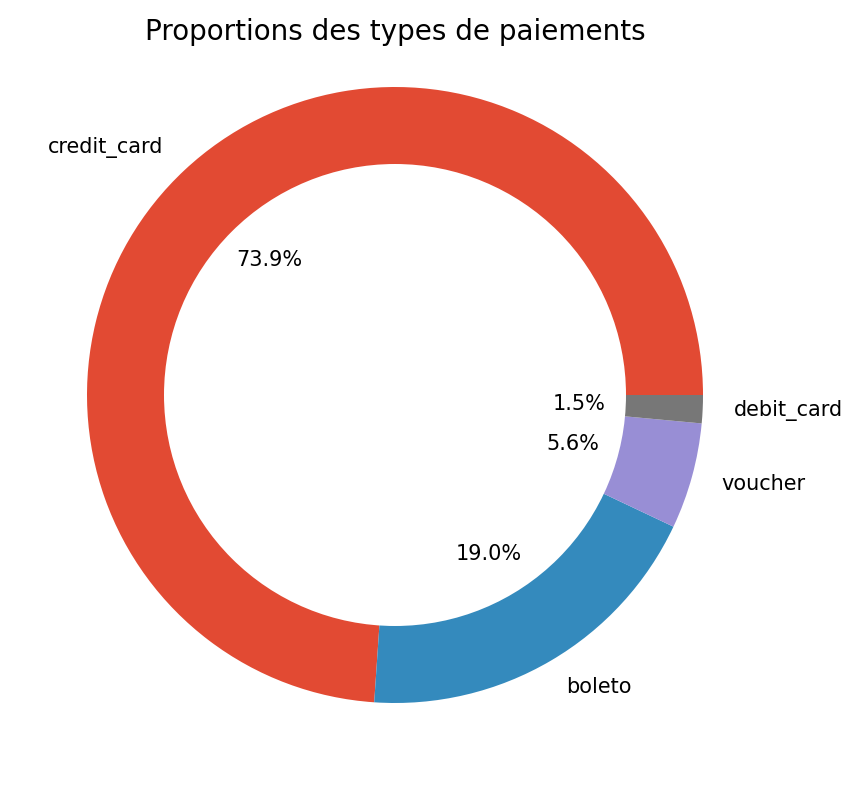

In [39]:
fig = plt.figure(figsize=(10, 10))
plt.title('Proportions des types de paiements', titleprops, y=0.95)
plt.pie(payments["payment_type"].value_counts(),
        labels=payments["payment_type"].unique(),
        autopct='%1.1f%%',
        textprops=textprops,
        startangle=0)
centre_circle = plt.Circle((0, 0), 0.75, fc='white')
fig.gca().add_artist(centre_circle)
plt.show()

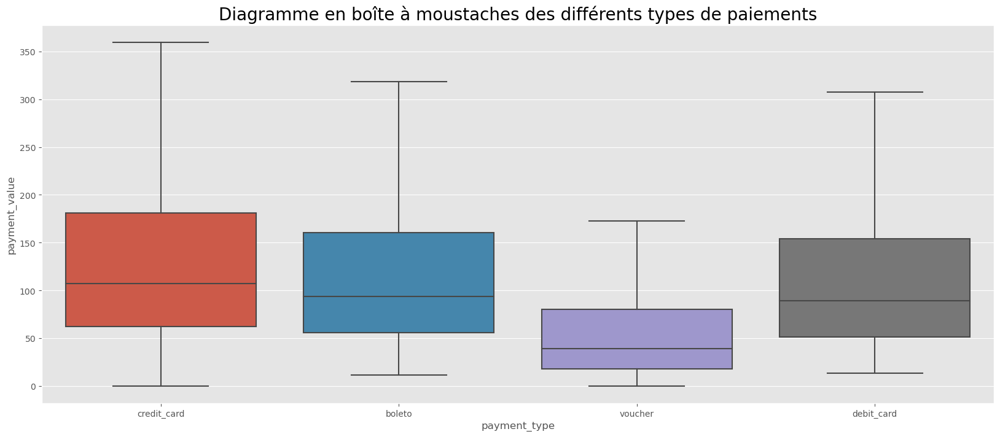

In [40]:
fig = plt.figure(figsize=(20, 8))
plt.title('Diagramme en boîte à moustaches des différents types de paiements',
          titleprops)
sns.boxplot(data=payments,
            y="payment_value",
            x="payment_type",
            showfliers=False)
plt.show()

Je constate que les paiments en "voucher" sont généralement pour des achats de plus petites valeurs par rapport aux autres types de paiements.

### 2.7 Étude des produits (products)

In [41]:
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [42]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


Je décide de remplacer les dimensions de chaque produit par son volume.

In [43]:
products['product_volume_cm3'] = products['product_length_cm'] * products['product_height_cm'] * products['product_width_cm']

Je supprime les trois autres paramètres.

In [44]:
products.drop(['product_length_cm', 'product_height_cm', 'product_width_cm'],
              axis=1,
              inplace=True)

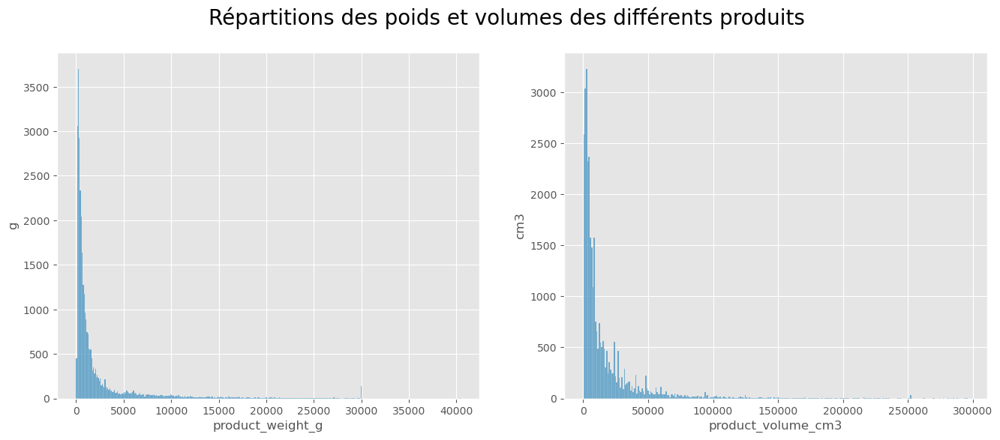

In [45]:
fig = plt.figure(1, figsize=(16, 6))
plt.suptitle('Répartitions des poids et volumes des différents produits',
             size=20)

plt.subplot(1, 2, 1)
plt.ylabel("g")
sns.histplot(products["product_weight_g"])

plt.subplot(1, 2, 2)
plt.ylabel("cm3")
sns.histplot(products["product_volume_cm3"])
plt.show()

Les répartitions sont très similaires, ce qui est normal car les deux paramètres sont corrélés.

In [46]:
products["product_volume_cm3"].corr(products["product_weight_g"])

0.8030048531338712

### 2.8 Étude des critiques (reviews)

In [47]:
reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [48]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


Nous pouvons observer la répartition des scores des différentes critiques.

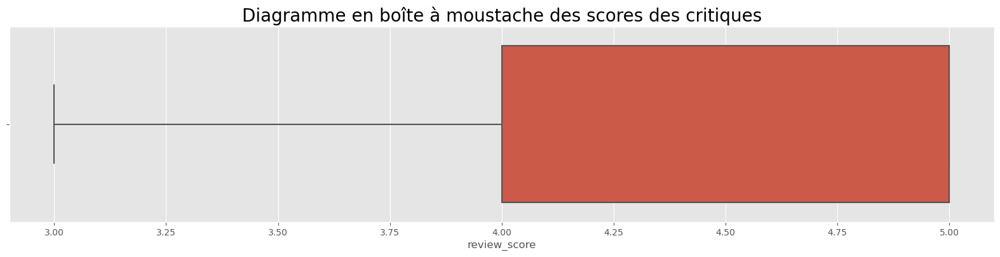

In [49]:
fig = plt.figure(figsize=(20, 4))
plt.title('Diagramme en boîte à moustache des scores des critiques',
          titleprops)
sns.boxplot(data=reviews, x="review_score", showfliers=False)

plt.show()

Les 3/4 des articles ont des scores de 4 ou 5.

In [50]:
reviews["review_score"].value_counts()

5    57328
4    19142
1    11424
3     8179
2     3151
Name: review_score, dtype: int64

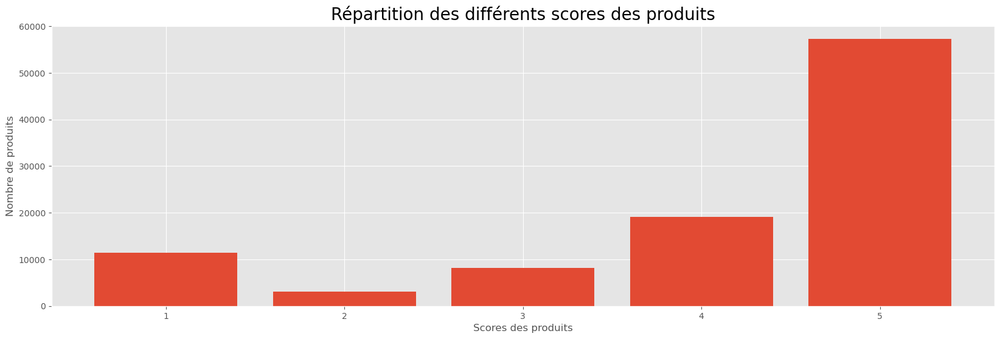

In [51]:
fig = plt.figure(figsize=(20, 6))
plt.bar(x=reviews["review_score"].value_counts().index,
        height=reviews["review_score"].value_counts().values)
plt.title("Répartition des différents scores des produits", titleprops)
plt.xlabel("Scores des produits")
plt.xticks(np.arange(1, 6, step=1))
plt.ylabel("Nombre de produits")
plt.show()

Une majorité des produit a un score de 5.

Je passe en 'datetime' les colonnes de dates.

In [52]:
date_columns = ['review_answer_timestamp',
                'review_creation_date']

In [53]:
reviews[date_columns] = reviews[date_columns].astype('datetime64[ns]')

### 2.9 Étude des traductions (tanslation)

In [54]:
translation.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [55]:
translation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [56]:
print("Le nombre de catégories traduites est de : {}".format(translation["product_category_name_english"].nunique()))

Le nombre de catégories traduites est de : 71


## <font color="#114b98" id="section_3">3. Concaténation des données</font>

Une image est fournie afin de comprendre les liens entre les différentes bases de données.

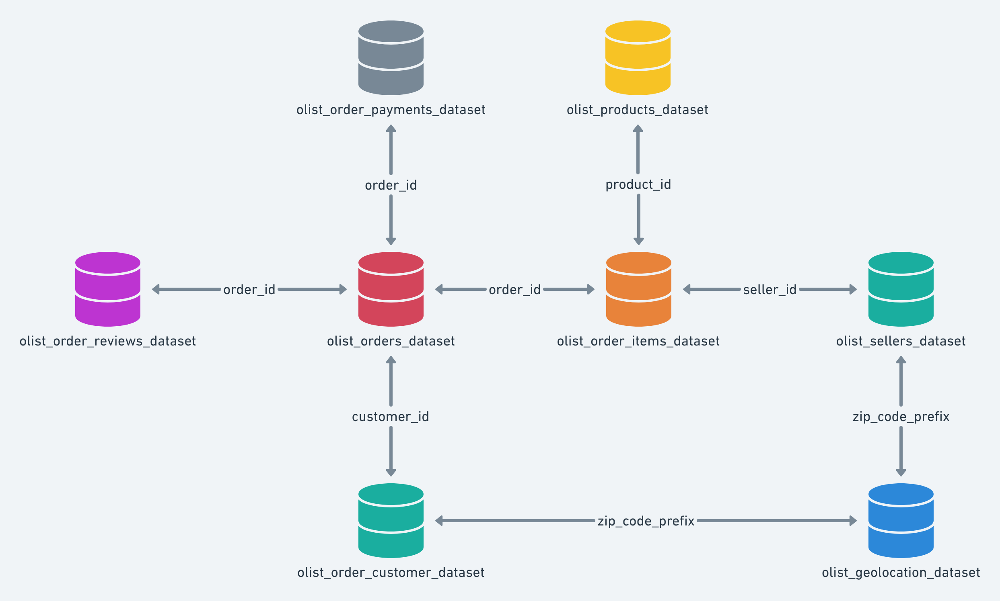

Nous allons utiliser ces relations afin de fusionner les différents jeux de données.

Les jeux de données orders, reviews, items et payments ont en commun le paramètre 'order_id'.

In [57]:
data = pd.merge(orders, reviews, on='order_id')

In [58]:
data.shape

(96361, 14)

In [59]:
data.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,e73b67b67587f7644d5bd1a52deb1b01,5,NaN,NaN,2018-08-18,2018-08-22 19:07:58
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,359d03e676b3c069f62cadba8dd3f6e8,5,NaN,O produto foi exatamente o que eu esperava e e...,2017-12-03,2017-12-05 19:21:58
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,e50934924e227544ba8246aeb3770dd4,5,NaN,NaN,2018-02-17,2018-02-18 13:02:51


In [60]:
data = pd.merge(data, items, on='order_id')

In [61]:
data.shape

(110013, 20)

In [62]:
data.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,e73b67b67587f7644d5bd1a52deb1b01,5,NaN,NaN,2018-08-18,2018-08-22 19:07:58,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,359d03e676b3c069f62cadba8dd3f6e8,5,NaN,O produto foi exatamente o que eu esperava e e...,2017-12-03,2017-12-05 19:21:58,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,e50934924e227544ba8246aeb3770dd4,5,NaN,NaN,2018-02-17,2018-02-18 13:02:51,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72


In [63]:
data = pd.merge(data, payments, on='order_id')

In [64]:
data.shape

(114859, 24)

In [65]:
data.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1,credit_card,1,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3,voucher,1,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2,voucher,1,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,1,boleto,1,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,e73b67b67587f7644d5bd1a52deb1b01,5,NaN,NaN,2018-08-18,2018-08-22 19:07:58,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,1,credit_card,3,179.12


Nous fusionnons maintenant ce nouveau dataset avec products avec le paramètre 'product_id'.

In [66]:
data = data.merge(products, on='product_id')

In [67]:
data.shape

(114859, 30)

In [68]:
data.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_volume_cm3
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1,credit_card,1,18.12,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3,voucher,1,2.00,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2,voucher,1,18.59,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,b46f1e34512b0f4c74a72398b03ca788,4,NaN,Deveriam embalar melhor o produto. A caixa vei...,2017-08-19,2017-08-20 15:16:36,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-21 20:05:16,29.99,7.78,1,credit_card,3,37.77,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,dc90f19c2806f1abba9e72ad3c350073,5,NaN,"Só achei ela pequena pra seis xícaras ,mais é ...",2017-08-08,2017-08-08 23:26:23,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-08 18:37:31,29.99,7.78,1,credit_card,1,37.77,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0


Nous allons maintenant supprimer les valeurs dupliquées du jeu de données "geolocation_zip_code_prefix".

In [69]:
geolocation["geolocation_zip_code_prefix"].duplicated().sum()

981111

In [70]:
geolocation.drop_duplicates(subset=["geolocation_zip_code_prefix"],
                            keep="first",
                            inplace=True)

Je peux maintenant obtenir une carte des géolocalisations (Folium ne pouvait gérer le nombre de données avec les dupliquées).

In [71]:
!pip install folium

In [72]:
import folium
from folium import plugins

carte = folium.Map(location=[geolocation['geolocation_lat'].mean(),
                             geolocation['geolocation_lng'].mean()],
                   zoom_start=4)

for i in range(0, len(geolocation)):
    folium.Circle([geolocation.iloc[i]['geolocation_lat'],
                   geolocation.iloc[i]['geolocation_lng']],
                  radius=30,
                  color='green').add_to(carte)
carte

Les vendeurs et acheteurs sont bien situés au Brésil.

Nous allons maintenant fusionner les localisation des vendeurs et acheteurs avec le nouveau dataset.

In [73]:
sellers = sellers.merge(geolocation,
                        how="left",
                        left_on=["seller_zip_code_prefix"],
                        right_on=["geolocation_zip_code_prefix"])

sellers['seller_lat'] = sellers['geolocation_lat']
sellers['seller_lng'] = sellers['geolocation_lng']

sellers.drop(columns=["geolocation_zip_code_prefix",
                      'geolocation_lat',
                      'geolocation_lng',
                      "geolocation_city",
                      "geolocation_state"],
             inplace=True)

In [74]:
data = data.merge(sellers, on='seller_id')

In [75]:
customers = customers.merge(geolocation,
                            how="left",
                            left_on=["customer_zip_code_prefix"],
                            right_on=["geolocation_zip_code_prefix"])

customers['customer_lat'] = customers['geolocation_lat']
customers['customer_lng'] = customers['geolocation_lng']

customers.drop(columns=["geolocation_zip_code_prefix",
                        'geolocation_lat',
                        'geolocation_lng',
                        "geolocation_city",
                        "geolocation_state"],
               inplace=True)

In [76]:
data = data.merge(customers, on='customer_id')

In [77]:
data.shape

(114859, 41)

Nous fusionnons enfin les traductions avec ce nouveau dataset avec le paramètre 'product_category_name'.

In [78]:
data = data.merge(translation, 
                  how='left', 
                  on='product_category_name')

In [79]:
data.shape

(114859, 42)

In [80]:
data.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_volume_cm3,seller_zip_code_prefix,seller_city,seller_state,seller_lat,seller_lng,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_lat,customer_lng,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1,credit_card,1,18.12,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0,9350,maua,SP,-23.680114,-46.452454,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,-23.574809,-46.587471,housewares
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3,voucher,1,2.00,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0,9350,maua,SP,-23.680114,-46.452454,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,-23.574809,-46.587471,housewares
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2,voucher,1,18.59,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0,9350,maua,SP,-23.680114,-46.452454,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,-23.574809,-46.587471,housewares
3,128e10d95713541c87cd1a2e48201934,a20e8105f23924cd00833fd87daa0831,delivered,2017-08-15 18:29:31,2017-08-15 20:05:16,2017-08-17 15:28:33,2017-08-18 14:44:43,2017-08-28,b46f1e34512b0f4c74a72398b03ca788,4,NaN,Deveriam embalar melhor o produto. A caixa vei...,2017-08-19,2017-08-20 15:16:36,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-21 20:05:16,29.99,7.78,1,credit_card,3,37.77,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0,9350,maua,SP,-23.680114,-46.452454,3a51803cc0d012c3b5dc8b7528cb05f7,3366,sao paulo,SP,-23.565578,-46.534603,housewares
4,0e7e841ddf8f8f2de2bad69267ecfbcf,26c7ac168e1433912a51b924fbd34d34,delivered,2017-08-02 18:24:47,2017-08-02 18:43:15,2017-08-04 17:35:43,2017-08-07 18:30:01,2017-08-15,dc90f19c2806f1abba9e72ad3c350073,5,NaN,"Só achei ela pequena pra seis xícaras ,mais é ...",2017-08-08,2017-08-08 23:26:23,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-08 18:37:31,29.99,7.78,1,credit_card,1,37.77,utilidades_domesticas,40.0,268.0,4.0,500.0,1976.0,9350,maua,SP,-23.680114,-46.452454,ef0996a1a279c26e7ecbd737be23d235,2290,sao paulo,SP,-23.543295,-46.630743,housewares


## <font color="#114b98" id="section_4">4. Traitement des données manquantes</font>

In [81]:
data.isna().sum()

order_id                              0
customer_id                           0
order_status                          0
order_purchase_timestamp              0
order_approved_at                    15
order_delivered_carrier_date          2
order_delivered_customer_date         8
order_estimated_delivery_date         0
review_id                             0
review_score                          0
review_comment_title             101275
review_comment_message            66767
review_creation_date                  0
review_answer_timestamp               0
order_item_id                         0
product_id                            0
seller_id                             0
shipping_limit_date                   0
price                                 0
freight_value                         0
payment_sequential                    0
payment_type                          0
payment_installments                  0
payment_value                         0
product_category_name              1626


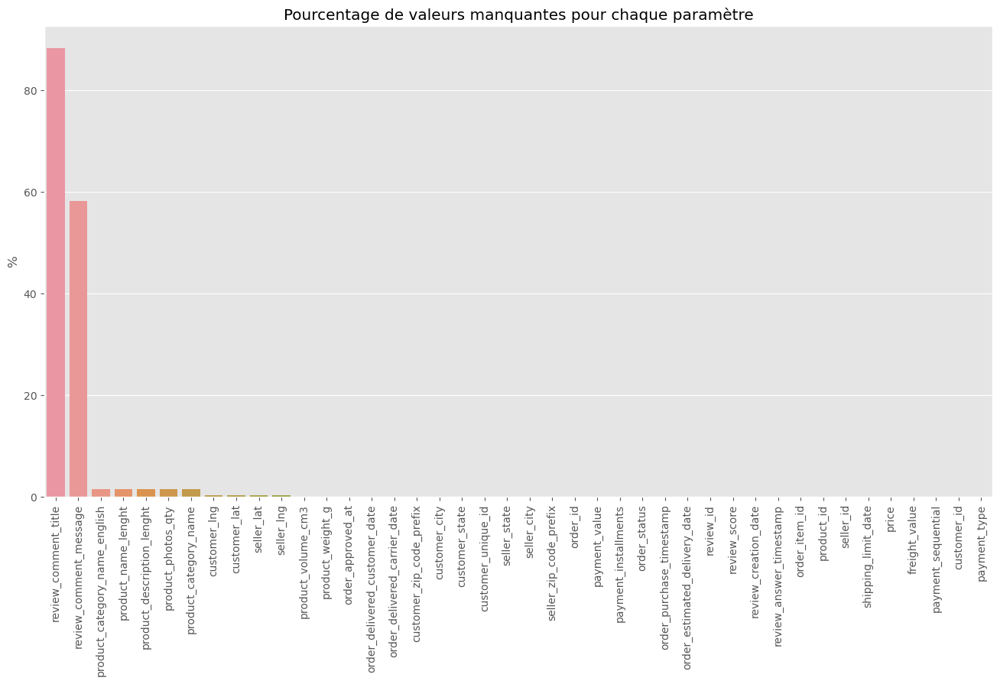

In [82]:
temp = data.isna().sum().sort_values(ascending=False)/len(data)*100
fig = plt.figure(figsize=(16, 8))
sns.barplot(x=temp.index, y=temp.values)
plt.title("Pourcentage de valeurs manquantes pour chaque paramètre")
plt.xticks(rotation=90)
plt.ylabel("%")
plt.show()

Je supprime les paramètres qui ont 50% de données manquantes ou plus.

In [83]:
cond = temp < 50
cond = cond[cond]
data = data.loc[:, cond.index]

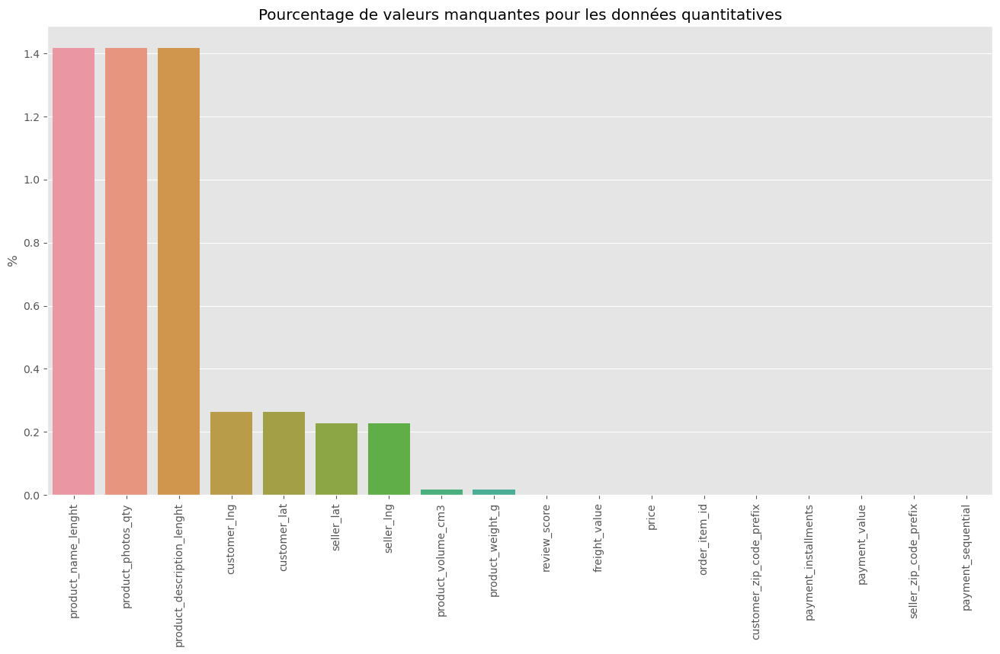

In [84]:
temp = data.select_dtypes(include=['int64', 'float64']).isna().sum().sort_values(ascending=False)/len(data)*100
fig = plt.figure(figsize=(16, 8))
sns.barplot(x=temp.index, y=temp.values)
plt.title("Pourcentage de valeurs manquantes pour les données quantitatives")
plt.xticks(rotation=90)
plt.ylabel("%")
plt.show()

Je vais imputer les valeurs manquantes quantitatives avec SimpleImputer.

In [85]:
from sklearn.impute import SimpleImputer

In [86]:
num_columns = list(data.select_dtypes(include='float64').columns)
data[num_columns] = SimpleImputer(strategy='median').fit_transform(data[num_columns])

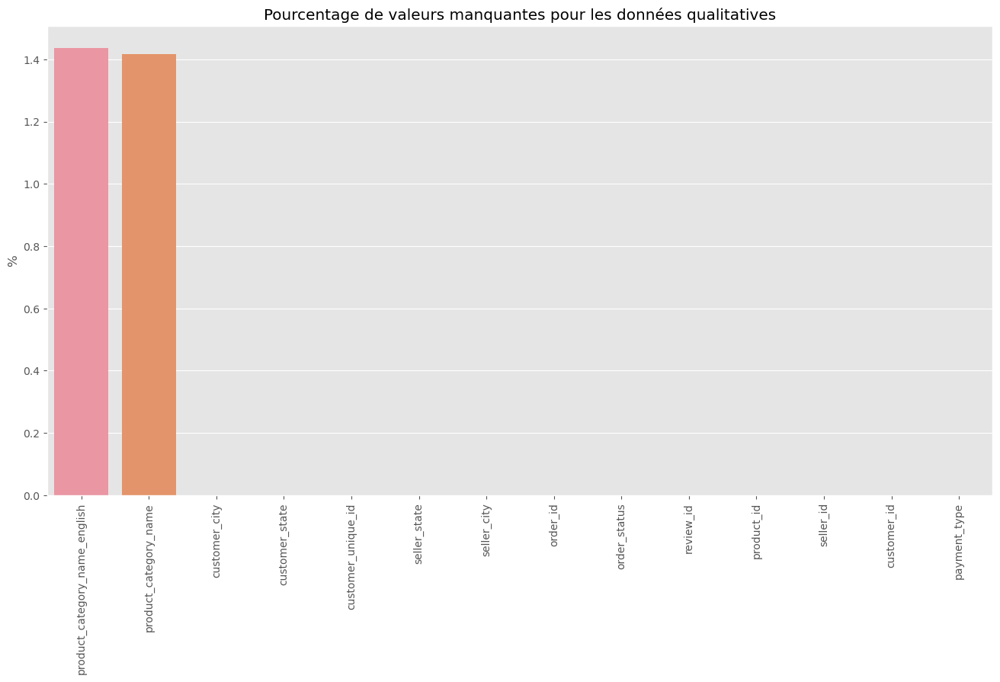

In [87]:
temp = data.select_dtypes(include='object').isna().sum().sort_values(ascending=False)/len(data)*100
fig = plt.figure(figsize=(16, 8))
sns.barplot(x=temp.index, y=temp.values)
plt.title("Pourcentage de valeurs manquantes pour les données qualitatives")
plt.xticks(rotation=90)
plt.ylabel("%")
plt.show()

Je vais imputer les valeurs manquantes qualitatives avec SimpleImputer.

In [88]:
obj_columns = list(data.select_dtypes(include='object').columns)
data[obj_columns] = data[obj_columns].astype('category')
data[obj_columns] = SimpleImputer(strategy='most_frequent').fit_transform(data[obj_columns])

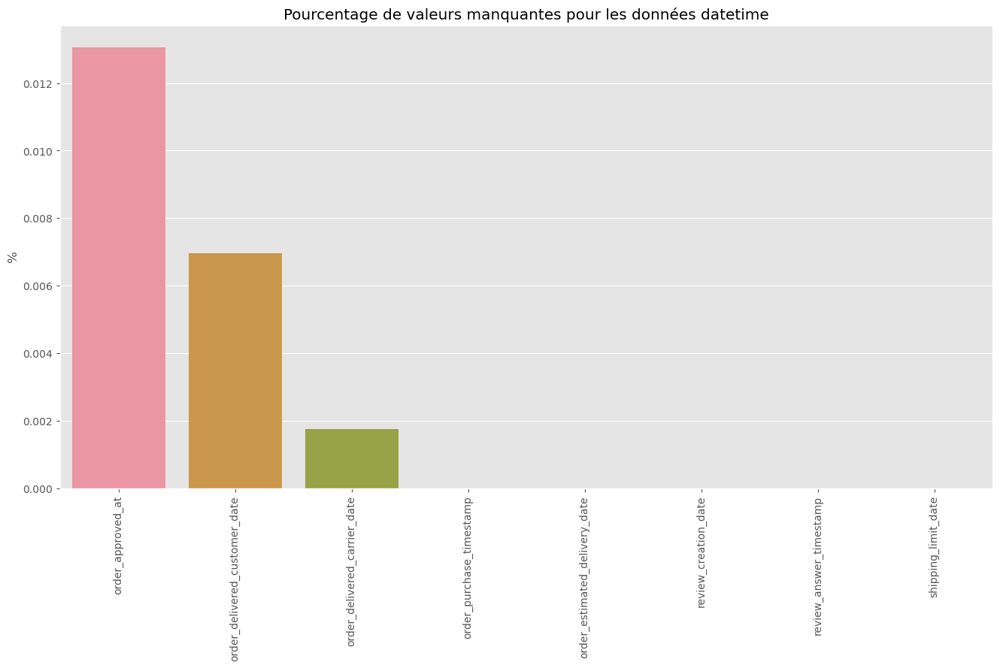

In [89]:
temp = data.select_dtypes(include='datetime').isna().sum().sort_values(ascending=False)/len(data)*100
fig = plt.figure(figsize=(16, 8))
sns.barplot(x=temp.index, y=temp.values)
plt.title("Pourcentage de valeurs manquantes pour les données datetime")
plt.xticks(rotation=90)
plt.ylabel("%")
plt.show()

In [90]:
date_columns = list(data.select_dtypes(include='datetime').columns)
date_columns

['order_approved_at',
 'order_delivered_customer_date',
 'order_delivered_carrier_date',
 'order_purchase_timestamp',
 'order_estimated_delivery_date',
 'review_creation_date',
 'review_answer_timestamp',
 'shipping_limit_date']

In [91]:
any((data['order_approved_at'].isna()) & (~(data['order_purchase_timestamp'].isna())))

True

In [92]:
data["diff1"] = data["order_approved_at"].dt.day - data["order_purchase_timestamp"].dt.day
data["diff1"].median()

0.0

Comme ces deux variables surviennent souvent le même jour, je remplace des données manquantes de "order_approved_at" par les données disponibles de "order_purchase_timestamp".

In [93]:
data.loc[data["order_approved_at"].isna(),
         "order_approved_at"] = \
data.loc[data["order_approved_at"].isna(),
         "order_purchase_timestamp"]

In [94]:
any((data['order_delivered_carrier_date'].isna()) & (~(data['order_estimated_delivery_date'].isna())))

True

In [95]:
data["diff2"] = data["order_delivered_carrier_date"].dt.day - data["order_estimated_delivery_date"].dt.day
data["diff2"].median()

3.0

Je remplace les valeurs manquantes par celles estimées auquelles j'ajoute la différence entre les dates de livraisons effectives et celles estimées.

In [96]:
data["diff2"] = data["order_estimated_delivery_date"] + dt.timedelta(days=data["diff2"].median())

In [97]:
data.loc[data["order_delivered_carrier_date"].isna(),
         "order_delivered_carrier_date"] = \
data.loc[data["order_delivered_carrier_date"].isna(),
         "diff2"]

In [98]:
any((data['order_delivered_customer_date'].isna()) & (~(data['order_delivered_carrier_date'].isna())))

True

In [99]:
data["diff3"] = data["order_delivered_customer_date"].dt.day - data["order_delivered_carrier_date"].dt.day
data["diff3"].median()

4.0

In [100]:
data["diff3"] = data["order_delivered_carrier_date"] + dt.timedelta(days=data["diff3"].median())

In [101]:
data.loc[data["order_delivered_customer_date"].isna(),
         "order_delivered_customer_date"] = \
data.loc[data["order_delivered_customer_date"].isna(),
         "diff3"]

In [102]:
data.drop(["diff1", "diff2", "diff3"], axis=1, inplace=True)

In [103]:
data.isna().sum().sum()

0

In [104]:
data.head()

,product_category_name_english,product_name_lenght,product_description_lenght,product_photos_qty,product_category_name,customer_lng,customer_lat,seller_lat,seller_lng,product_volume_cm3,product_weight_g,order_approved_at,order_delivered_customer_date,order_delivered_carrier_date,customer_zip_code_prefix,customer_city,customer_state,customer_unique_id,seller_state,seller_city,seller_zip_code_prefix,order_id,payment_value,payment_installments,order_status,order_purchase_timestamp,order_estimated_delivery_date,review_id,review_score,review_creation_date,review_answer_timestamp,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,customer_id,payment_type
0,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.587471,-23.574809,-23.680114,-46.452454,1976.0,500.0,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-04 19:55:00,3149,sao paulo,SP,7c396fd4830fd04220f754e42b4e5bff,SP,maua,9350,e481f51cbdc54678b7cc49136f2d6af7,18.12,1,delivered,2017-10-02 10:56:33,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1,9ef432eb6251297304e76186b10a928d,credit_card
1,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.587471,-23.574809,-23.680114,-46.452454,1976.0,500.0,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-04 19:55:00,3149,sao paulo,SP,7c396fd4830fd04220f754e42b4e5bff,SP,maua,9350,e481f51cbdc54678b7cc49136f2d6af7,2.00,1,delivered,2017-10-02 10:56:33,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3,9ef432eb6251297304e76186b10a928d,voucher
2,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.587471,-23.574809,-23.680114,-46.452454,1976.0,500.0,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-04 19:55:00,3149,sao paulo,SP,7c396fd4830fd04220f754e42b4e5bff,SP,maua,9350,e481f51cbdc54678b7cc49136f2d6af7,18.59,1,delivered,2017-10-02 10:56:33,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2,9ef432eb6251297304e76186b10a928d,voucher
3,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.534603,-23.565578,-23.680114,-46.452454,1976.0,500.0,2017-08-15 20:05:16,2017-08-18 14:44:43,2017-08-17 15:28:33,3366,sao paulo,SP,3a51803cc0d012c3b5dc8b7528cb05f7,SP,maua,9350,128e10d95713541c87cd1a2e48201934,37.77,3,delivered,2017-08-15 18:29:31,2017-08-28,b46f1e34512b0f4c74a72398b03ca788,4,2017-08-19,2017-08-20 15:16:36,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-21 20:05:16,29.99,7.78,1,a20e8105f23924cd00833fd87daa0831,credit_card
4,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.630743,-23.543295,-23.680114,-46.452454,1976.0,500.0,2017-08-02 18:43:15,2017-08-07 18:30:01,2017-08-04 17:35:43,2290,sao paulo,SP,ef0996a1a279c26e7ecbd737be23d235,SP,maua,9350,0e7e841ddf8f8f2de2bad69267ecfbcf,37.77,1,delivered,2017-08-02 18:24:47,2017-08-15,dc90f19c2806f1abba9e72ad3c350073,5,2017-08-08,2017-08-08 23:26:23,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-08 18:37:31,29.99,7.78,1,26c7ac168e1433912a51b924fbd34d34,credit_card


In [105]:
data.shape

(114859, 40)

In [106]:
data.isna().sum().sum()

0

## <font color="#114b98" id="section_5">5. Analyse multivariée</font>

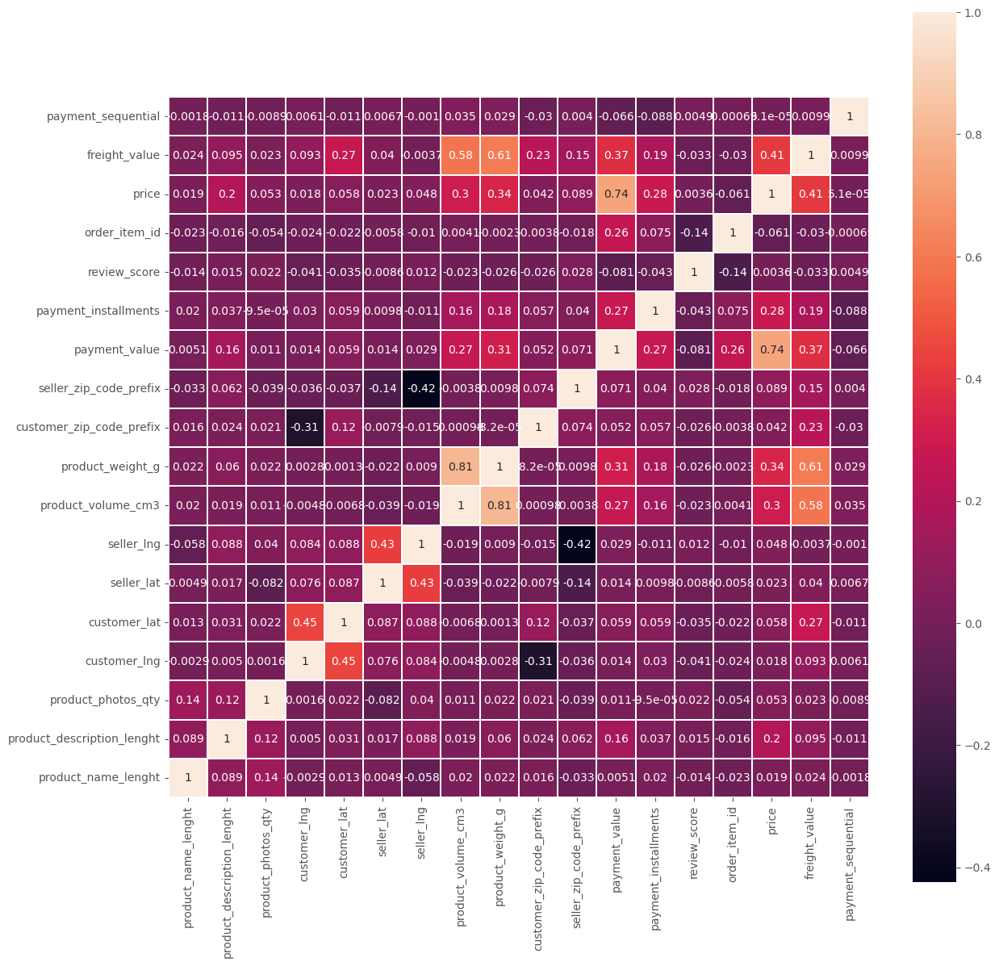

In [107]:
corr_matrix = data.corr()
fig = plt.figure(1, figsize=(14, 14))
sns.heatmap(corr_matrix, square=True, linewidths=0.1, annot=True)
plt.xlim(0, corr_matrix.shape[1])
plt.ylim(0, corr_matrix.shape[0])
plt.show()

Nous retrouvons les corrélations suivantes :
 - poids et volume du produit
 - poids du produit et coût du transport
 - volume du produit et coût du transport
 - prix du produit et valeur du paiement

Je décide de créer une variable masse volumique afin de réduire les dimensions du jeu de données.

In [108]:
data['product_masse_vol'] = data['product_weight_g'] / data['product_volume_cm3']

Je supprime les deux autres paramètres.

In [109]:
data.drop(['product_weight_g', 'product_volume_cm3'], axis=1, inplace=True)

Je regarde le score d'un produit en fonction du temps de livaison.

In [110]:
data['delivery_time_days'] = data['order_delivered_customer_date'].dt.day - data['order_approved_at'].dt.day

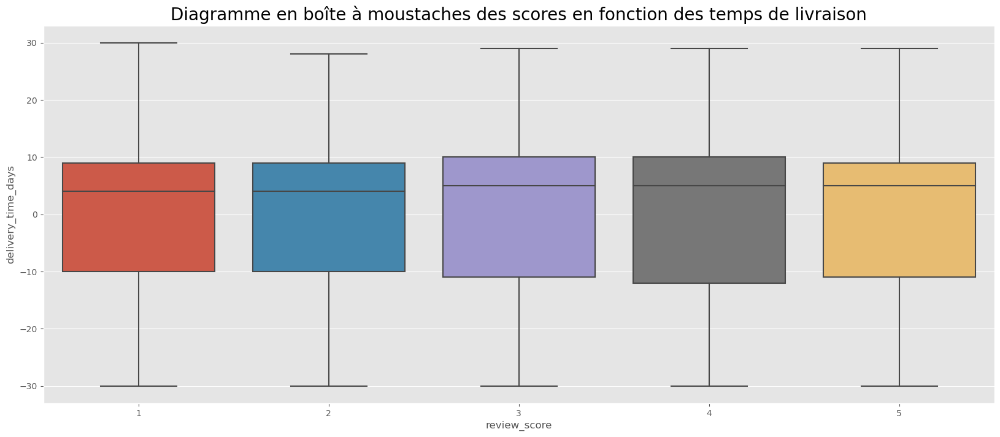

In [111]:
fig = plt.figure(figsize=(20, 8))
plt.title('Diagramme en boîte à moustaches des scores en fonction des temps de livraison', titleprops)
sns.boxplot(data=data,
            x="review_score",
            y="delivery_time_days")
plt.show()

Les scores des produits ne sont pas influencés par le temps de livraison.

Je regarde le score d'un produit en fonction du prix de la transaction.

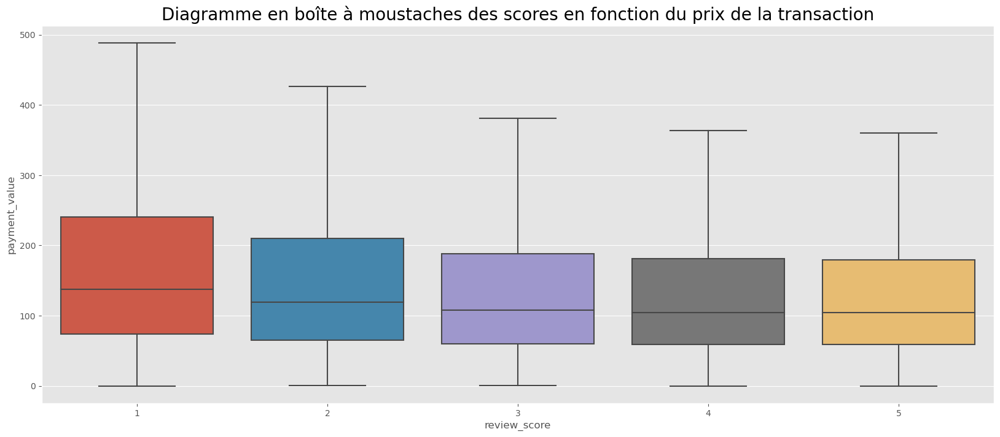

In [112]:
fig = plt.figure(figsize=(20, 8))
plt.title('Diagramme en boîte à moustaches des scores en fonction du prix de la transaction', titleprops)
sns.boxplot(data=data,
            x="review_score",
            y="payment_value",
            showfliers=False)
plt.show()

Les produits les moins chers ont les meilleurs scores.

Je regarde maintenant le nombre de ventes réalisées par trimestre.

In [113]:
data["purchase_quarter"] = data["order_purchase_timestamp"].map(lambda q: q.quarter)

In [114]:
quarters = ["Q1", "Q2", "Q3", "Q4"]

In [115]:
payment_value_quarter = data.groupby("purchase_quarter")["payment_value"].sum().sort_values(ascending=False).reset_index()
order_quarter = data["purchase_quarter"].value_counts().sort_index()

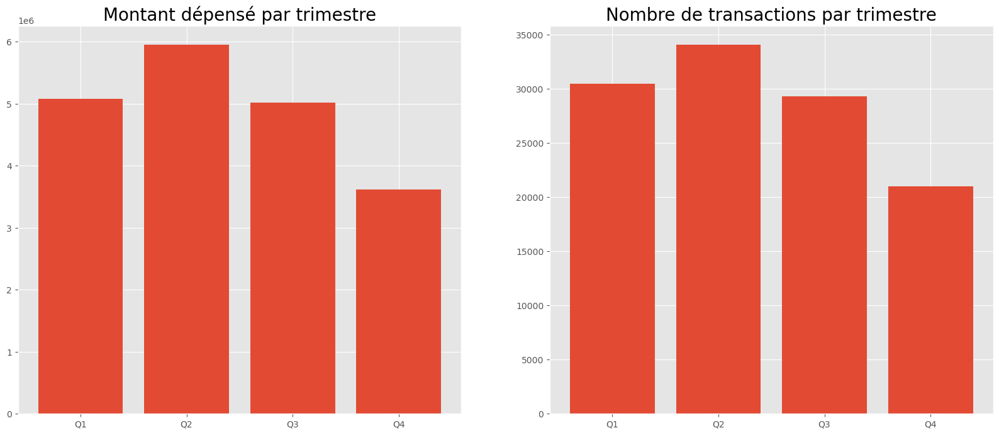

In [116]:
fig = plt.figure(figsize=(20, 8))

plt.subplot(121)
plt.bar(x=payment_value_quarter["purchase_quarter"], height=payment_value_quarter["payment_value"])
plt.title("Montant dépensé par trimestre", titleprops)
plt.xticks(np.arange(1, 5), quarters)

plt.subplot(122)
plt.bar(x=order_quarter.index, height=order_quarter.values)
plt.title("Nombre de transactions par trimestre", titleprops)
plt.xticks(np.arange(1, 5), quarters)

plt.show()

Le 2nd trimestre est le plus prolifique. Le dernier trimestre est celui avec le moins de transactions et le moins de paiements.

Je regarde maintenant le nombre de ventes réalisées par mois.

In [117]:
data["purchase_month"] = data["order_purchase_timestamp"].map(lambda m: m.month)

In [118]:
months = ["Janvier", "Fevrier", "Mars",
          "Avril", "Mai", "Juin",
          "Juillet", "Aout", "Septembre",
          "Octobre", "Novembre", "Decembre"]

In [119]:
payment_value_month = data.groupby("purchase_month")["payment_value"].sum().sort_values(ascending=False).reset_index()
order_month = data["purchase_month"].value_counts().sort_index()

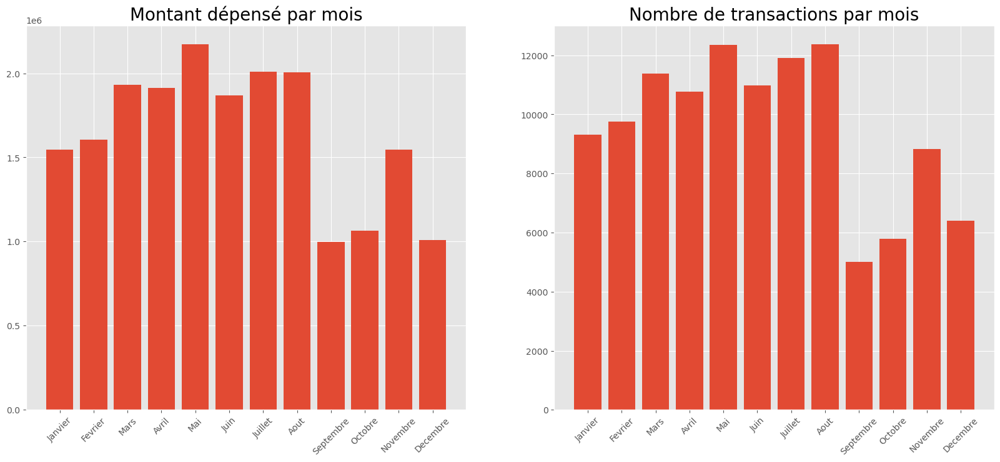

In [120]:
fig = plt.figure(figsize=(20, 8))

plt.subplot(121)
plt.bar(x=payment_value_month["purchase_month"], height=payment_value_month["payment_value"])
plt.title("Montant dépensé par mois", titleprops)
plt.xticks(np.arange(1, 13), months, rotation=45)

plt.subplot(122)
plt.bar(x=order_month.index, height=order_month.values)
plt.title("Nombre de transactions par mois", titleprops)
plt.xticks(np.arange(1, 13), months, rotation=45)

plt.show()

Nous remarquons bien une chute des ventes lors des quatre derniers mois de l'année.

Je regarde maintenant le nombre de ventes réalisées par semaine.

In [121]:
data["purchase_week"] = data["order_purchase_timestamp"].map(lambda w: w.week)

In [122]:
payment_value_week = data.groupby("purchase_week")["payment_value"].sum().sort_values(ascending=False).reset_index()
order_week = data["purchase_week"].value_counts().sort_index()

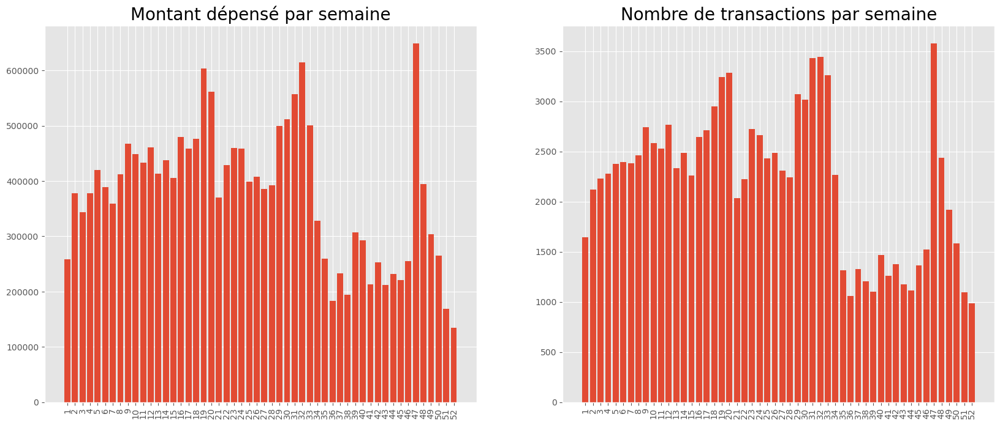

In [123]:
fig = plt.figure(figsize=(20, 8))

plt.subplot(121)
plt.bar(x=payment_value_week["purchase_week"], height=payment_value_week["payment_value"])
plt.title("Montant dépensé par semaine", titleprops)
plt.xticks(np.arange(1, 53), rotation=90)

plt.subplot(122)
plt.bar(x=order_week.index, height=order_week.values)
plt.title("Nombre de transactions par semaine", titleprops)
plt.xticks(np.arange(1, 53), rotation=90)

plt.show()

Nous observons un pic pour la semaine du "Black Friday".

Je regarde maintenant le nombre de ventes réalisées par jour.

In [124]:
data["purchase_day"] = data["order_purchase_timestamp"].map(lambda d: d.dayofweek)

In [125]:
payment_value_day = data.groupby("purchase_day")["payment_value"].sum().sort_values(ascending=False).reset_index()
order_day = data["purchase_day"].value_counts().sort_index()

In [126]:
days = ['Lundi', 'Mardi', 'Mercredi', 'Jeudi', 'Vendredi', 'Samedi', 'Dimanche']

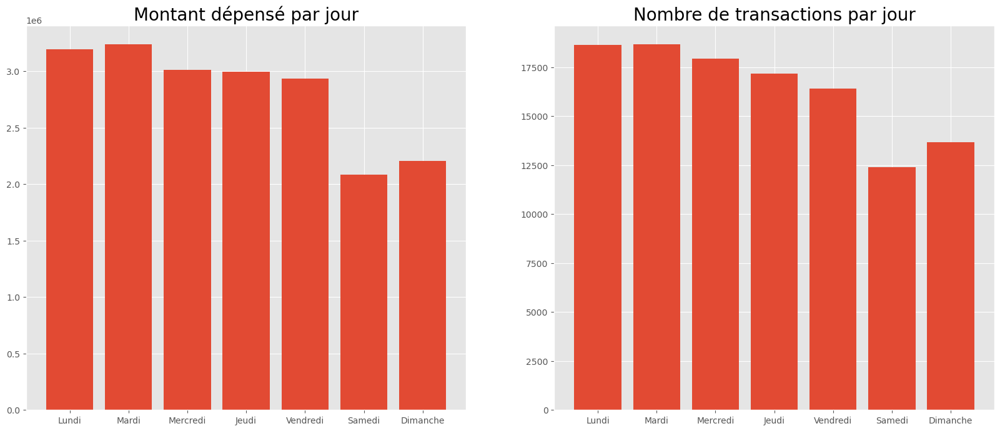

In [127]:
fig = plt.figure(figsize=(20, 8))

plt.subplot(121)
plt.bar(x=payment_value_day["purchase_day"], height=payment_value_day["payment_value"])
plt.title("Montant dépensé par jour", titleprops)
plt.xticks(np.arange(0, 7), days)

plt.subplot(122)
plt.bar(x=order_day.index, height=order_day.values)
plt.title("Nombre de transactions par jour", titleprops)
plt.xticks(np.arange(0, 7), days)

plt.show()

Il y a moins de vente le weekend.

Je regarde maintenant le nombre de ventes réalisées par heure.

In [128]:
data["purchase_hour"] = data["order_purchase_timestamp"].map(lambda h: h.hour)

In [129]:
payment_value_hour = data.groupby("purchase_hour")["payment_value"].sum().sort_values(ascending=False).reset_index()
order_hour = data["purchase_hour"].value_counts().sort_index()

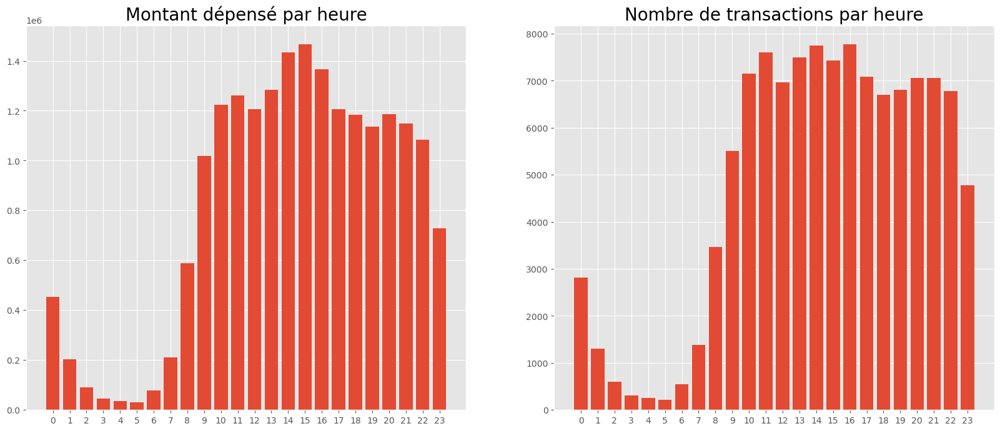

In [130]:
fig = plt.figure(figsize=(20, 8))

plt.subplot(121)
plt.bar(x=payment_value_hour["purchase_hour"], height=payment_value_hour["payment_value"])
plt.title("Montant dépensé par heure", titleprops)
plt.xticks(np.arange(0, 24))

plt.subplot(122)
plt.bar(x=order_hour.index, height=order_hour.values)
plt.title("Nombre de transactions par heure", titleprops)
plt.xticks(np.arange(0, 24))

plt.show()

La majorité des vente est réalisée entre 8h et 23h.

In [131]:
data.columns

Index(['product_category_name_english', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty',
       'product_category_name', 'customer_lng', 'customer_lat', 'seller_lat',
       'seller_lng', 'order_approved_at', 'order_delivered_customer_date',
       'order_delivered_carrier_date', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'customer_unique_id', 'seller_state',
       'seller_city', 'seller_zip_code_prefix', 'order_id', 'payment_value',
       'payment_installments', 'order_status', 'order_purchase_timestamp',
       'order_estimated_delivery_date', 'review_id', 'review_score',
       'review_creation_date', 'review_answer_timestamp', 'order_item_id',
       'product_id', 'seller_id', 'shipping_limit_date', 'price',
       'freight_value', 'payment_sequential', 'customer_id', 'payment_type',
       'product_masse_vol', 'delivery_time_days', 'purchase_quarter',
       'purchase_month', 'purchase_week', 'purchase_day', 'purchase_h

Je supprime certaines colonnes créées uniquement pour l'analyse.

In [132]:
data.drop(columns=['purchase_quarter',
                   'purchase_month',
                   'purchase_week',
                   'purchase_day',
                   'purchase_hour'],
          inplace=True)

In [133]:
data.head()

,product_category_name_english,product_name_lenght,product_description_lenght,product_photos_qty,product_category_name,customer_lng,customer_lat,seller_lat,seller_lng,order_approved_at,order_delivered_customer_date,order_delivered_carrier_date,customer_zip_code_prefix,customer_city,customer_state,customer_unique_id,seller_state,seller_city,seller_zip_code_prefix,order_id,payment_value,payment_installments,order_status,order_purchase_timestamp,order_estimated_delivery_date,review_id,review_score,review_creation_date,review_answer_timestamp,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,customer_id,payment_type,product_masse_vol,delivery_time_days
0,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.587471,-23.574809,-23.680114,-46.452454,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-04 19:55:00,3149,sao paulo,SP,7c396fd4830fd04220f754e42b4e5bff,SP,maua,9350,e481f51cbdc54678b7cc49136f2d6af7,18.12,1,delivered,2017-10-02 10:56:33,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1,9ef432eb6251297304e76186b10a928d,credit_card,0.253036,8
1,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.587471,-23.574809,-23.680114,-46.452454,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-04 19:55:00,3149,sao paulo,SP,7c396fd4830fd04220f754e42b4e5bff,SP,maua,9350,e481f51cbdc54678b7cc49136f2d6af7,2.00,1,delivered,2017-10-02 10:56:33,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3,9ef432eb6251297304e76186b10a928d,voucher,0.253036,8
2,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.587471,-23.574809,-23.680114,-46.452454,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-04 19:55:00,3149,sao paulo,SP,7c396fd4830fd04220f754e42b4e5bff,SP,maua,9350,e481f51cbdc54678b7cc49136f2d6af7,18.59,1,delivered,2017-10-02 10:56:33,2017-10-18,a54f0611adc9ed256b57ede6b6eb5114,4,2017-10-11,2017-10-12 03:43:48,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2,9ef432eb6251297304e76186b10a928d,voucher,0.253036,8
3,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.534603,-23.565578,-23.680114,-46.452454,2017-08-15 20:05:16,2017-08-18 14:44:43,2017-08-17 15:28:33,3366,sao paulo,SP,3a51803cc0d012c3b5dc8b7528cb05f7,SP,maua,9350,128e10d95713541c87cd1a2e48201934,37.77,3,delivered,2017-08-15 18:29:31,2017-08-28,b46f1e34512b0f4c74a72398b03ca788,4,2017-08-19,2017-08-20 15:16:36,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-21 20:05:16,29.99,7.78,1,a20e8105f23924cd00833fd87daa0831,credit_card,0.253036,3
4,housewares,40.0,268.0,4.0,utilidades_domesticas,-46.630743,-23.543295,-23.680114,-46.452454,2017-08-02 18:43:15,2017-08-07 18:30:01,2017-08-04 17:35:43,2290,sao paulo,SP,ef0996a1a279c26e7ecbd737be23d235,SP,maua,9350,0e7e841ddf8f8f2de2bad69267ecfbcf,37.77,1,delivered,2017-08-02 18:24:47,2017-08-15,dc90f19c2806f1abba9e72ad3c350073,5,2017-08-08,2017-08-08 23:26:23,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-08-08 18:37:31,29.99,7.78,1,26c7ac168e1433912a51b924fbd34d34,credit_card,0.253036,5


## <font color="#114b98" id="section_6">6. Sauvegarde des données</font>

Je supprime les colonnes qui ne me semblent pas pertinentes pour la segmentation.

In [134]:
data.drop(columns=['seller_zip_code_prefix',
                   'seller_lat',
                   'seller_lng',
                   'seller_state',
                   'seller_city',
                   'seller_id',
                   'product_name_lenght',
                   'product_description_lenght',
                   'product_photos_qty',
                   'product_category_name',
                   'order_delivered_carrier_date',
                   'payment_installments',
                   'order_delivered_customer_date',
                   'order_status',
                   'review_id',
                   'review_creation_date',
                   'review_answer_timestamp',
                   'product_masse_vol',
                   'delivery_time_days',
                   'order_estimated_delivery_date',
                   'order_item_id',
                   'product_id',
                   'shipping_limit_date',
                   'freight_value',
                   'payment_sequential',
                   'price',
                   'order_id',
                   'customer_unique_id',
                   'order_approved_at',
                   'customer_zip_code_prefix',
                   'customer_city',
                   'customer_lng',
                   'customer_lat',
                   'payment_type',
                   'customer_state',
                   'product_category_name_english'],
          inplace=True)

Je retire du jeu de données certaines valeurs nulles de montants.

In [135]:
data = data[data['payment_value']>0]

In [136]:
data.reset_index(inplace=True, drop=True)

In [137]:
data.shape

(114855, 4)

Je conserve dans mon jeu de données les variables suivantes :
 - 'customer_id', 'payment_value' et 'order_purchase_timestamp' pour réaliser la segmentation RFM
 - 'review_score' afin de l'ajouter lors d'une segmentation améliorée

In [138]:
data.head()

,payment_value,order_purchase_timestamp,review_score,customer_id
0,18.12,2017-10-02 10:56:33,4,9ef432eb6251297304e76186b10a928d
1,2.00,2017-10-02 10:56:33,4,9ef432eb6251297304e76186b10a928d
2,18.59,2017-10-02 10:56:33,4,9ef432eb6251297304e76186b10a928d
3,37.77,2017-08-15 18:29:31,4,a20e8105f23924cd00833fd87daa0831
4,37.77,2017-08-02 18:24:47,5,26c7ac168e1433912a51b924fbd34d34


In [139]:
data.to_csv(main_path+'saved_ressources/'+'data_olist_clean.csv', index=False)